<h1>COVID-19 Exploratory data analysis</h1>

In [3]:
import pandas as pd
import numpy as np
import scipy.stats as ss
import dython
from dython.nominal import associations
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import datetime
import seaborn as sns

In [4]:
df = pd.read_csv('covid_19_data.csv')

<h2>Bulk data analysis</h2>

In [5]:
print(df.shape)

(98252, 8)


In [6]:
df.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [7]:
df.drop(['SNo'],axis=1).describe()

,Confirmed,Deaths,Recovered
count,98252.000000,98252.000000,9.825200e+04
mean,15442.707232,692.502310,8.392821e+03
std,46813.313272,2712.094164,4.751247e+04
min,0.000000,0.000000,0.000000e+00
25%,181.000000,2.000000,2.000000e+00
50%,1622.000000,31.000000,2.870000e+02
75%,8301.250000,264.000000,2.850000e+03
max,801422.000000,42072.000000,2.140614e+06


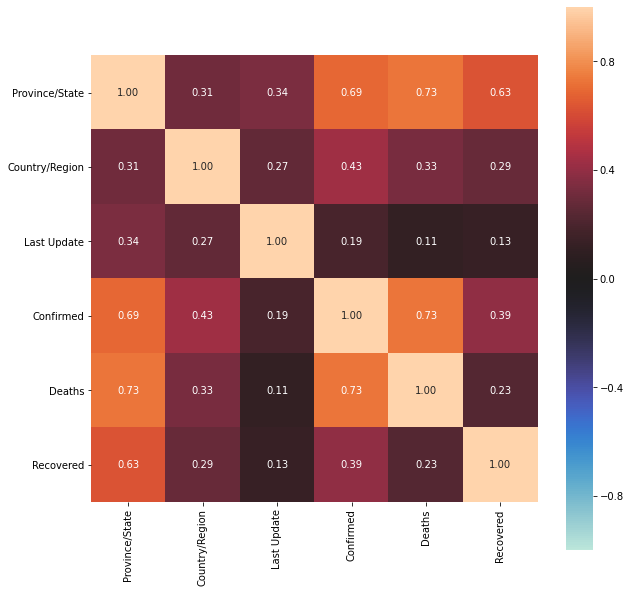

{'corr':                 Province/State  Country/Region  Last Update  Confirmed  \
Province/State        1.000000        0.307108     0.339651   0.688716   
Country/Region        0.307108        1.000000     0.268956   0.430274   
Last Update           0.339651        0.268956     1.000000   0.194405   
Confirmed             0.688716        0.430274     0.194405   1.000000   
Deaths                0.732399        0.331472     0.110925   0.732345   
Recovered             0.630382        0.285104     0.132563   0.392970   

                  Deaths  Recovered  
Province/State  0.732399   0.630382  
Country/Region  0.331472   0.285104  
Last Update     0.110925   0.132563  
Confirmed       0.732345   0.392970  
Deaths          1.000000   0.230472  
Recovered       0.230472   1.000000  , 'ax': <matplotlib.axes._subplots.AxesSubplot object at 0x000001C5AD0B6E48>}


In [8]:
cols = [col for col in df.columns if col not in ['SNo','ObservationDate']]
print(associations(df[cols],figsize=(10,10)))

<h2>Null Values</h2>

In [9]:
df.isnull().sum()

SNo                    0
ObservationDate        0
Province/State     31153
Country/Region         0
Last Update            0
Confirmed              0
Deaths                 0
Recovered              0
dtype: int64

<h2>Percentage of NULL values</h2>

In [10]:
(df.isnull().sum()/df.shape[0])*100

SNo                 0.000000
ObservationDate     0.000000
Province/State     31.707243
Country/Region      0.000000
Last Update         0.000000
Confirmed           0.000000
Deaths              0.000000
Recovered           0.000000
dtype: float64

<h2>Fill NULL values</h2>

In [11]:
df['Province/State'] = df['Province/State'].fillna('Unrecorded')

In [12]:
df.dtypes

SNo                  int64
ObservationDate     object
Province/State      object
Country/Region      object
Last Update         object
Confirmed          float64
Deaths             float64
Recovered          float64
dtype: object

In [13]:
df[['Confirmed','Deaths','Recovered']] = df[['Confirmed','Deaths','Recovered']].astype(int)

In [14]:
df.dtypes

SNo                 int64
ObservationDate    object
Province/State     object
Country/Region     object
Last Update        object
Confirmed           int32
Deaths              int32
Recovered           int32
dtype: object

<h2>Unique values</h2>

In [15]:
df.nunique()

SNo                98252
ObservationDate      221
Province/State       724
Country/Region       223
Last Update         1962
Confirmed          27310
Deaths              6527
Recovered          17342
dtype: int64

In [16]:
df['Country/Region'].unique()

array(['Mainland China', 'Hong Kong', 'Macau', 'Taiwan', 'US', 'Japan',
       'Thailand', 'South Korea', 'Singapore', 'Philippines', 'Malaysia',
       'Vietnam', 'Australia', 'Mexico', 'Brazil', 'Colombia', 'France',
       'Nepal', 'Canada', 'Cambodia', 'Sri Lanka', 'Ivory Coast',
       'Germany', 'Finland', 'United Arab Emirates', 'India', 'Italy',
       'UK', 'Russia', 'Sweden', 'Spain', 'Belgium', 'Others', 'Egypt',
       'Iran', 'Israel', 'Lebanon', 'Iraq', 'Oman', 'Afghanistan',
       'Bahrain', 'Kuwait', 'Austria', 'Algeria', 'Croatia',
       'Switzerland', 'Pakistan', 'Georgia', 'Greece', 'North Macedonia',
       'Norway', 'Romania', 'Denmark', 'Estonia', 'Netherlands',
       'San Marino', ' Azerbaijan', 'Belarus', 'Iceland', 'Lithuania',
       'New Zealand', 'Nigeria', 'North Ireland', 'Ireland', 'Luxembourg',
       'Monaco', 'Qatar', 'Ecuador', 'Azerbaijan', 'Czech Republic',
       'Armenia', 'Dominican Republic', 'Indonesia', 'Portugal',
       'Andorra', 'Latvia

In [17]:
df['Country/Region'].replace({'Mainland China':'China'},inplace=True)

<h2>All columns</h2>

In [18]:
df.columns

Index(['SNo', 'ObservationDate', 'Province/State', 'Country/Region',
       'Last Update', 'Confirmed', 'Deaths', 'Recovered'],
      dtype='object')

<h2>Feature modeling - live cases</h2>

Live cases are = Confirmed cases - (Deaths + Recovered)

In [19]:
df['Live cases'] = df['Confirmed'] - (df['Deaths']+df['Recovered'])

In [20]:
df.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,Live cases
0,1,01/22/2020,Anhui,China,1/22/2020 17:00,1,0,0,1
1,2,01/22/2020,Beijing,China,1/22/2020 17:00,14,0,0,14
2,3,01/22/2020,Chongqing,China,1/22/2020 17:00,6,0,0,6
3,4,01/22/2020,Fujian,China,1/22/2020 17:00,1,0,0,1
4,5,01/22/2020,Gansu,China,1/22/2020 17:00,0,0,0,0


We require the latest update for the current numbers. Set the last update as the most recent one

In [21]:
df[df['Province/State']=='Anhui']

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,Live cases
0,1,01/22/2020,Anhui,China,1/22/2020 17:00,1,0,0,1
38,39,01/23/2020,Anhui,China,1/23/20 17:00,9,0,0,9
95,96,01/24/2020,Anhui,China,1/24/20 17:00,15,0,0,15
131,132,01/25/2020,Anhui,China,1/25/20 17:00,39,0,0,39
176,177,01/26/2020,Anhui,China,1/26/20 16:00,60,0,0,60
...,...,...,...,...,...,...,...,...,...
94732,94733,08/25/2020,Anhui,China,2020-08-26 04:28:11,991,6,985,0
95474,95475,08/26/2020,Anhui,China,2020-08-27 04:28:15,991,6,985,0
96216,96217,08/27/2020,Anhui,China,2020-08-28 04:28:11,991,6,985,0
96958,96959,08/28/2020,Anhui,China,2020-08-29 04:28:19,991,6,985,0


In [22]:
DF = df[df['ObservationDate']==max(df['ObservationDate'])].reset_index()

In [23]:
DF.drop(['index'],axis=1,inplace=True)

In [24]:
DF.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,Live cases
0,97511,08/29/2020,Unrecorded,Afghanistan,2020-08-30 04:28:22,38143,1402,29063,7678
1,97512,08/29/2020,Unrecorded,Albania,2020-08-30 04:28:22,9279,275,5020,3984
2,97513,08/29/2020,Unrecorded,Algeria,2020-08-30 04:28:22,43781,1491,30717,11573
3,97514,08/29/2020,Unrecorded,Andorra,2020-08-30 04:28:22,1124,53,902,169
4,97515,08/29/2020,Unrecorded,Angola,2020-08-30 04:28:22,2551,107,1041,1403


In [25]:
DF[DF['Province/State']=='Anhui']

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,Live cases
190,97701,08/29/2020,Anhui,China,2020-08-30 04:28:22,991,6,985,0


<h2>Exploratory Data analysis</h2>

We have a common last update value for all columns, we can use it as the latest statistic of our dataset

In [26]:
DF.nunique()

SNo                742
ObservationDate      1
Province/State     563
Country/Region     190
Last Update          1
Confirmed          714
Deaths             449
Recovered          589
Live cases         627
dtype: int64

In [27]:
df1 = DF.groupby(['ObservationDate'])[['Confirmed','Live cases','Recovered','Deaths']].sum().reset_index()
df1

,ObservationDate,Confirmed,Live cases,Recovered,Deaths
0,08/29/2020,24996456,7744200,16409757,842499


In [28]:
cols = ['Last Update','Confirmed','Live cases','Recovered','Deaths']
splot = go.Figure(data=[go.Table(header=dict(values=cols),cells=dict(values=df1.loc[0,['ObservationDate','Confirmed','Live cases','Recovered','Deaths']]))])
splot.update_layout(title='Current COVID-19 statistics around the world')
splot.show()

In [29]:
cols = ['Live cases','Recovered','Deaths']
values = df1.loc[0,cols]
fig = px.pie(df1,values=values,names=cols)
fig.update_layout(title='Cases to date:'+str(df1['Confirmed'][0]))
fig.show()

<h2>Coronavirus with respect to time</h2>

In [30]:
df2 = df.groupby('ObservationDate')[['Confirmed','Live cases','Recovered','Deaths']].sum().reset_index()

In [31]:
df2.head()

,ObservationDate,Confirmed,Live cases,Recovered,Deaths
0,01/22/2020,555,510,28,17
1,01/23/2020,653,605,30,18
2,01/24/2020,941,879,36,26
3,01/25/2020,1438,1357,39,42
4,01/26/2020,2118,2010,52,56


In [32]:
df2 = df2.sort_values(by='ObservationDate',ascending=True).reset_index()

In [33]:
df2.drop(['index'],axis=1,inplace=True)

In [34]:
df2.head()

,ObservationDate,Confirmed,Live cases,Recovered,Deaths
0,01/22/2020,555,510,28,17
1,01/23/2020,653,605,30,18
2,01/24/2020,941,879,36,26
3,01/25/2020,1438,1357,39,42
4,01/26/2020,2118,2010,52,56


In [35]:
splot = go.Figure()
splot.add_trace(go.Scatter(x=df2.index,y=df2.Confirmed,mode='lines',name='Total confirmed cases'))
splot.update_layout(title='Rate of infection with respect to time',xaxis_title='Days',yaxis_title='Total confirmed cases',template='plotly_white')
splot.show()

In [36]:
splot1 = go.Figure()
splot1.add_trace(go.Scatter(x=df2.index,y=df2['Live cases'],mode='lines',name='Live Cases'))
splot1.update_layout(title='Active case rate with respect to time',xaxis_title='Days',yaxis_title='Total Live cases',template='plotly_white')
splot1.show()

In [37]:
splot3 = go.Figure()
splot3.add_trace(go.Scatter(x=df2.index,y=df2.Recovered,mode='lines',name='Recovered'))
splot3.update_layout(title='Recovery rate with resepct to time',xaxis_title='Days',yaxis_title='Recovered',template='plotly_white')

In [38]:
splot3 = go.Figure()
splot3.add_trace(go.Scatter(x=df2.index,y=df2.Deaths,mode='lines',name='Deaths',marker_color='red'))
splot3.update_layout(title='Death toll with resepct to time',xaxis_title='Days',yaxis_title='Deaths',template='plotly_dark')

In [39]:
t1 = go.Figure(go.Bar(x=df2.ObservationDate,y=df2.Confirmed))
t1.update_layout(title='Confirmed cases with respect to days',template='plotly_white',xaxis_title='Total confirmed cases',yaxis_title='Days')
t1.show()

In [40]:
t1 = go.Figure(go.Bar(x=df2.ObservationDate,y=df2['Live cases']))
t1.update_layout(title='Live cases with respect to days',template='plotly_white',xaxis_title='Total live cases',yaxis_title='Days')
t1.show()

In [41]:
t1 = go.Figure(go.Bar(x=df2.ObservationDate,y=df2.Recovered,marker_color='rgb(17,247,5)'))
t1.update_layout(title='Recovered cases with respect to days',template='plotly_white',xaxis_title='Total recovered cases',yaxis_title='Days')
t1.show()

In [42]:
t1 = go.Figure(go.Bar(x=df2.ObservationDate,y=df2.Deaths,marker_color='rgb(255,0,0)'))
t1.update_layout(title='Death toll with respect to days',template='plotly_dark',xaxis_title='Total deaths',yaxis_title='Days')
t1.show()

<h2>Cases with respect to Country</h2>

In [43]:
df3 = df.groupby('Country/Region')[['Confirmed','Live cases','Recovered','Deaths']]

In [44]:
df3 = df3.sum().reset_index()

In [45]:
df3 = df3.sort_values('Confirmed',ascending=False).reset_index(drop=True)

In [46]:
summ = go.Figure(data=[go.Table(header=dict(values=['<b>Name of country</b>','<b>Total confirmed cases</b>'],fill_color='grey',align=['center','center'],font=dict(color='white',size=14)),
                               cells=dict(values=[df3['Country/Region'],df3['Confirmed']],fill_color='white',line_color='grey',align=['center','center'],font=dict(color='black',size=12)))])
summ.update_layout(title='Total confirmed cases with respect to country')
summ.show()

In [47]:
b1 = go.Figure(go.Bar(x=df3.Confirmed,y=df3['Country/Region'],orientation='h'))
b1.update_layout(title='Confirmed cases with respect to country',template='plotly_white',xaxis_title='Confirmed cases',yaxis_title='Countries')
b1.show()

In [48]:
b2 = go.Figure(go.Bar(x=df3['Live cases'],y=df3['Country/Region'],orientation='h'))
b2.update_layout(title='Live cases with respect to country',template='plotly_white',xaxis_title='Live cases',yaxis_title='Countries')
b2.show()

In [49]:
b3 = go.Figure(go.Bar(x=df3.Recovered,y=df3['Country/Region'],orientation='h',marker_color='Green'))
b3.update_layout(title='Recovered cases with respect to country',template='plotly_white',xaxis_title='Recovered cases',yaxis_title='Countries')
b3.show()

In [50]:
b3 = go.Figure(go.Bar(x=df3.Deaths,y=df3['Country/Region'],orientation='h',marker_color='Red'))
b3.update_layout(title='Death toll with respect to country',template='plotly_dark',xaxis_title='Deaths',yaxis_title='Countries')
b3.show()

<h2>Map plots</h2>

In [51]:
m1 = px.choropleth(df3,locations=df3['Country/Region'],color=df3.Confirmed,locationmode='country names',hover_name=df3['Country/Region'],color_continuous_scale=px.colors.sequential.Cividis_r)
m1.update_layout(title='Confirmed cases in each country')
m1.show()

In [52]:
m2 = px.choropleth(df3,locations=df3['Country/Region'],color=df3['Live cases'],locationmode='country names',hover_name=df3['Country/Region'])
m2.update_layout(title='Live cases in each country')
m2.show()

In [53]:
m3 = px.choropleth(df3,locations=df3['Country/Region'],color=df3.Recovered,locationmode='country names',hover_name=df3['Country/Region'],color_continuous_scale=px.colors.sequential.Tealgrn)
m3.update_layout(title='Recovered cases in each country')
m3.show()

In [54]:
m4 = px.choropleth(df3,locations=df3['Country/Region'],color=df3.Deaths,locationmode='country names',hover_name=df3['Country/Region'],color_continuous_scale='OrRd',template='plotly_dark')
m4.update_layout(title='Deaths in each country')
m4.show()

COVID trends over time

In [55]:
df4 = df.groupby(['Country/Region','ObservationDate'])[['Confirmed','Live cases','Recovered','Deaths']].sum().reset_index()
df4.head()

,Country/Region,ObservationDate,Confirmed,Live cases,Recovered,Deaths
0,Azerbaijan,02/28/2020,1,1,0,0
1,"('St. Martin',)",03/10/2020,2,2,0,0
2,Afghanistan,02/24/2020,1,1,0,0
3,Afghanistan,02/25/2020,1,1,0,0
4,Afghanistan,02/26/2020,1,1,0,0


In [56]:
df4 = df4.sort_values('ObservationDate',ascending=True).reset_index(drop=True)
df4.head()

,Country/Region,ObservationDate,Confirmed,Live cases,Recovered,Deaths
0,South Korea,01/22/2020,1,1,0,0
1,Taiwan,01/22/2020,1,1,0,0
2,Hong Kong,01/22/2020,0,0,0,0
3,Japan,01/22/2020,2,2,0,0
4,China,01/22/2020,547,502,28,17


In [57]:
m1 = px.choropleth(df4,locations=df4['Country/Region'],color=df4.Confirmed,locationmode='country names',hover_name=df4['Country/Region'],color_continuous_scale=px.colors.sequential.Cividis_r,animation_frame='ObservationDate')
m1.update_layout(title='Confirmed cases in each country')
m1.show()

In [58]:
m2 = px.choropleth(df4,locations=df4['Country/Region'],color=df4['Live cases'],locationmode='country names',hover_name=df4['Country/Region'],animation_frame='ObservationDate')
m2.update_layout(title='Live cases in each country')
m2.show()

In [59]:
m3 = px.choropleth(df4,locations=df4['Country/Region'],color=df4.Recovered,locationmode='country names',hover_name=df4['Country/Region'],color_continuous_scale=px.colors.sequential.Tealgrn,animation_frame='ObservationDate')
m3.update_layout(title='Recovered cases in each country')
m3.show()

In [60]:
m4 = px.choropleth(df4,locations=df4['Country/Region'],color=df4.Deaths,locationmode='country names',hover_name=df4['Country/Region'],color_continuous_scale='OrRd',template='plotly_dark',animation_frame='ObservationDate')
m4.update_layout(title='Deaths in each country')
m4.show()

In [61]:
bar1 = go.Figure(data=[go.Bar(x=df3['Country/Region'][0:10],y=df3['Confirmed'][0:10],text=df3['Confirmed'][0:10],marker_color='black',textposition='auto')])
bar1.update_layout(title='Top infected countries',xaxis_title='Countries',yaxis_title='Confirmed cases',template='plotly_white')
bar1.show()

In [62]:
bar1 = go.Figure(data=[go.Bar(x=df3['Country/Region'][0:10],y=df3['Live cases'][0:10],text=df3['Confirmed'][0:10],marker_color='black',textposition='auto')])
bar1.update_layout(title='Top live cases countries',xaxis_title='Countries',yaxis_title='Live case count',template='plotly_white')
bar1.show()

In [63]:
bar1 = go.Figure(data=[go.Bar(x=df3['Country/Region'][0:10],y=df3['Recovered'][0:10],text=df3['Confirmed'][0:10],marker_color='green',textposition='auto')])
bar1.update_layout(title='Top recovered cases countries',xaxis_title='Countries',yaxis_title='Recovered cases',template='plotly_white')
bar1.show()

In [64]:
bar1 = go.Figure(data=[go.Bar(x=df3['Country/Region'][0:10],y=df3['Deaths'][0:10],text=df3['Confirmed'][0:10],marker_color='green',textposition='auto')])
bar1.update_layout(title='Top death tolls',xaxis_title='Countries',yaxis_title='Deaths',template='plotly_white')
bar1.show()

In [65]:
fig = go.Figure(data=[go.Scatter(x=df3['Country/Region'][0:10],y=df3.Confirmed[0:10],mode='markers',marker=dict(color=100+np.random.randn(500),size=(df3['Confirmed'][0:10]/2500000),showscale=True))])
fig.update_layout(title='Top confirmed cases',xaxis_title='Countries',yaxis_title='Confirmed cases',template='plotly_white')
fig.show()

<h2>Live cases</h2>

In [66]:
df5 = df.groupby(["Country/Region"])["Live cases"].sum().reset_index().sort_values("Live cases",ascending=False).reset_index(drop=True)

In [67]:
summ = go.Figure(data=[go.Table(header=dict(values=['<b>Name of country</b>','<b>Total active cases</b>'],fill_color='grey',align=['center','center'],font=dict(color='white',size=14)),
                               cells=dict(values=[df5['Country/Region'],df5['Live cases']],fill_color='white',line_color='grey',align=['center','center'],font=dict(color='black',size=12)))])
summ.update_layout(title='Total live cases with respect to country')
summ.show()

In [68]:
bar1 = go.Figure(data=[go.Bar(x=df5['Country/Region'][0:10],y=df5['Live cases'][0:10],text=df5['Live cases'][0:10],marker_color='black',textposition='auto')])
bar1.update_layout(title='Top live cases countries',xaxis_title='Countries',yaxis_title='Live case count',template='plotly_white')
bar1.show()

In [69]:
fig = go.Figure(data=[go.Scatter(x=df5['Country/Region'][0:10],y=df5['Live cases'][0:10],mode='markers',marker=dict(color=100+np.random.randn(500),size=(df5['Live cases'][0:10]/1500000),showscale=True))])
fig.update_layout(title='Live cases',xaxis_title='Countries',yaxis_title='Live cases',template='plotly_white')
fig.show()

In [70]:
fig = go.Figure(data=[go.Scatter(x=df3['Country/Region'][0:10],y=df3['Live cases'][0:10],mode='markers',marker=dict(color=100+np.random.randn(500),size=(df3['Live cases'][0:10]/1500000),showscale=True))])
fig.update_layout(title='Live cases',xaxis_title='Countries',yaxis_title='Live cases',template='plotly_white')
fig.show()

<h2>Death Toll</h2>

In [71]:
df6 = df.groupby(['Country/Region'])[['Deaths']].sum().reset_index().sort_values(by='Deaths',ascending=False).reset_index(drop=True)

In [72]:
df6.head()

,Country/Region,Deaths
0,US,16373394
1,Brazil,7403667
2,UK,5398648
3,Italy,4872239
4,France,4051434


In [73]:
dth = go.Figure(data=[go.Table(header=dict(values=['<b>Name of country</b>','<b>Total Deaths</b>'],fill_color='grey',align=['center','center'],font=dict(color='white',size=14)),
                               cells=dict(values=[df6['Country/Region'],df6['Deaths']],fill_color='white',line_color='grey',align=['center','center'],font=dict(color='black',size=12)))])
dth.update_layout(title='Total deaths with respect to country')
dth.show()

In [74]:
bar1 = go.Figure(data=[go.Bar(x=df6['Country/Region'][0:10],y=df6['Deaths'][0:10],text=df6['Deaths'][0:10],marker_color='red',textposition='auto')])
bar1.update_layout(title='Death tolls',xaxis_title='Countries',yaxis_title='Death toll',template='plotly_dark')
bar1.show()

In [75]:
fig = go.Figure(data=[go.Scatter(x=df6['Country/Region'][0:10],y=df6['Deaths'][0:10],mode='markers',marker=dict(color=100+np.random.randn(500),size=(df6['Deaths'][0:10]/150000),showscale=True),marker_colorscale='Oranges')])
fig.update_layout(title='Total Deaths with respect to country',xaxis_title='Countries',yaxis_title='Deaths',template='plotly_dark')
fig.show()

<h2>Recovered cases</h2>

In [76]:
df7 = df.groupby('Country/Region').sum().reset_index().sort_values(by='Recovered',ascending=False).reset_index(drop=True)

In [77]:
df7.head()

,Country/Region,SNo,Confirmed,Deaths,Recovered,Live cases
0,Brazil,169507248,194933354,7403667,138263751,49265936
1,US,425503615,396234081,16373394,114488854,265371833
2,India,204030481,122656809,2703456,82585555,37367798
3,Russia,488053726,75257596,1124198,48625808,25507590
4,Iran,7297706,30414143,1651912,24785578,3976653


In [78]:
dth = go.Figure(data=[go.Table(header=dict(values=['<b>Name of country</b>','<b>Total Recovered cases</b>'],fill_color='grey',align=['center','center'],font=dict(color='white',size=14)),
                               cells=dict(values=[df7['Country/Region'],df7['Recovered']],fill_color='white',line_color='grey',align=['center','center'],font=dict(color='black',size=12)))])
dth.update_layout(title='Total deaths with respect to country')
dth.show()

In [79]:
bar1 = go.Figure(data=[go.Bar(x=df7['Country/Region'][0:10],y=df7['Recovered'][0:10],text=df7['Recovered'][0:10],marker_color='green',textposition='auto')])
bar1.update_layout(title='Top 10 countries - Recovered cases',xaxis_title='Countries',yaxis_title='Death toll',template='plotly_white')
bar1.show()

In [80]:
fig = go.Figure(data=[go.Scatter(x=df7['Country/Region'][0:10],y=df7['Recovered'][0:10],mode='markers',marker=dict(color=100+np.random.randn(500),size=(df7['Recovered'][0:10]/1050000),showscale=True),marker_colorscale='Greens')])
fig.update_layout(title='Total Recovered cases with respect to country',xaxis_title='Countries',yaxis_title='Recovered',template='plotly_white')
fig.show()

<h2>Conclusion</h2>
Through the given notebook, we were able to derive key-insights regarding the spread and patterns of the COVID-19 pandemic. We can further analyze each country through their respective datasets to dig deeper and extract patterns or causes regarding the same